# Structure of this scipt

A. Main figures
1. Overview of seismicity and sequences 
2. General significance of variation of b-values (histograms)
3. Test of systematic shifts of the b-value
4. Mapping the b-value and comparing to the sequence-b-values

B. Supplement figures
1. Robustness analysis
2. Synthetic tests

# Imports

In [1]:
%config InlineBackend.figure_format ='retina'
from pathlib import Path
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
import io

import numpy as np
import pandas as pd
from scipy import stats

import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from cartopy import geodesic
from cmcrameri import cm
import matplotlib.image as mpimg
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.patches import Rectangle
from matplotlib.patches import Rectangle, Circle

from seismostats import Catalog
from seismostats.plots import plot_mags_in_time
from functions.geofunctions import load_japan_polygon
from functions.main_functions import (
    find_sequences, load_catalog, test_hypothesis)

# Load variables

In [103]:
DIR = Path("data")
variables_df = pd.read_csv(DIR / "variables.csv")
variables = variables_df.to_dict(orient="records")[0]

SHAPE_DIR = Path(variables["SHAPE_DIR"])
CAT_DIR = Path(variables["CAT_DIR"])

# b-val estimation
MC_FIXED = variables["MC_FIXED"]
CORRECTION_FACTOR = variables["CORRECTION_FACTOR"]
DELTA_M = variables["DELTA_M"] 
B_METHOD = variables["B_METHOD"]

# transformation to local
EPSG_JAPAN_M = variables["EPSG_JAPAN_M"]

# sequences
DIMENSION = variables["DIMENSION"]
BUFFER_M = variables["BUFFER_M"]
MAGNITUDE_THRESHOLD = variables["MAGNITUDE_THRESHOLD"]
RUPTURE_RELATION = variables["RUPTURE_RELATION"]
DAYS_AFTER = variables["DAYS_AFTER"]
DAYS_BEFORE = variables["DAYS_BEFORE"]
RADIUS_FAR = variables["RADIUS_FAR"]
EXCLUDE_AFTERSHOCK_DAYS = variables["EXCLUDE_AFTERSHOCK_DAYS"]
MIN_N_SEQ = variables["MIN_N_SEQ"]

# for map
N_FULL_MAP = variables["N_FULL_MAP"]

# evaluation
P_THRESHOLD = variables["P_THRESHOLD"]


# Load data

In [3]:
# Catalogs
fname_close = "df_japan_buffered_catalog_"+ str(int(BUFFER_M/1000))+"km_" + str(DIMENSION) + "D.csv"
fname_far = "df_japan_buffered_catalog_400km_"+ str(DIMENSION) +"D.csv"
cat_close_unfiltered = load_catalog(fname_close, 0, DELTA_M, CAT_DIR)
cat_close = load_catalog(fname_close, MC_FIXED - CORRECTION_FACTOR, DELTA_M, CAT_DIR)
cat_400km = load_catalog(fname_far, MC_FIXED - CORRECTION_FACTOR, DELTA_M, CAT_DIR)

In [4]:
# Coastline Japan

# Define the column names based on the data structure
column_names = [
    "longitude", "latitude"
]

# Read the file into a DataFrame
file_path = SHAPE_DIR / "coast_japan_only_borders.m"  # Update with the actual file path
df_coast = pd.read_csv(file_path, delim_whitespace=True, names=column_names)

/var/folders/2_/2txg_9093x37rv1ls3774xkc0000gn/T/ipykernel_54347/369115673.py:10: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df_coast = pd.read_csv(file_path, delim_whitespace=True, names=column_names)


In [5]:
# polygon of Japan with buffer

japan_poly = load_japan_polygon(SHAPE_DIR)

polygon_gdf_projected = japan_poly.to_crs(epsg=EPSG_JAPAN_M)
buffered_polygon_close = polygon_gdf_projected.buffer(40000)
buffered_polygon_close = buffered_polygon_close.to_crs(japan_poly.crs).geometry.iloc[0]

# A. 1 Overview of seismicity and sequences 

In [6]:
N_REALIZATIONS = 100
job_index = 9

# each job_index should perform 10 realizations
realization_indices = range(job_index * 10, (job_index + 1) * 10)
print(realization_indices)

range(90, 100)


In [7]:
# find sequences
seqs, main_idx, cat_close = find_sequences(
    cat_close, cat_400km,
    magnitude_threshold=MAGNITUDE_THRESHOLD,
    relation=RUPTURE_RELATION,
    days_after=pd.Timedelta(days=DAYS_AFTER),
    days_before=pd.Timedelta(days=DAYS_BEFORE),
    exclude_aftershocks=pd.Timedelta(days=EXCLUDE_AFTERSHOCK_DAYS),
    dimension=DIMENSION,
    radius_far=RADIUS_FAR,
    min_n_seq=MIN_N_SEQ,
)

print(f"Found {len(seqs)} sequences.")

Found 50 sequences.


In [8]:
# select large events only
df_japan_Large_close = cat_close[cat_close['magnitude'] >= MAGNITUDE_THRESHOLD]
df_japan_Large_400km = cat_400km[cat_400km['magnitude'] >= MAGNITUDE_THRESHOLD]

In [9]:
# Plot map
 
lcc = ccrs.LambertConformal(central_longitude=137, central_latitude=36,
                            standard_parallels=(30, 40))  # standard parallels are typically chosen to bracket your area
fig_map, ax_map = plt.subplots(figsize=(8, 8), subplot_kw={'projection': lcc})


# Coastline
ax_map.plot(df_coast['longitude'], df_coast['latitude'], 'k', linewidth=0.5, transform=ccrs.PlateCarree())

# plot the polygon polygon_coast
x, y = buffered_polygon_close.exterior.xy
ax_map.plot(x, y, color='indianred', linewidth=1, linestyle='--', label=str(int(BUFFER_M/1000)) + ' km distance to coast', transform=ccrs.PlateCarree())

# scatter large events
df_japan_Large_400km_not_in_sequences = df_japan_Large_400km[~df_japan_Large_400km.index.isin(main_idx)]
ax_map.scatter(
    df_japan_Large_400km_not_in_sequences['longitude'],
    df_japan_Large_400km_not_in_sequences['latitude'],
    s=40, c='lightgrey',
    linewidth=0.2,
    marker='*',
    edgecolor='black',
    label=r'M $\geq$ 6 events',
    transform=ccrs.PlateCarree())

# Filter finite
valid_lon = df_coast['longitude'][np.isfinite(df_coast['longitude'])]
valid_lat = df_coast['latitude'][np.isfinite(df_coast['latitude'])]

lon_min = valid_lon.min() - 0.5
lon_max = valid_lon.max() + 0.5
lat_min = valid_lat.min() - 0.5
lat_max = valid_lat.max() + 0.5

gl = ax_map.gridlines(
    crs=ccrs.PlateCarree(),
    draw_labels=True,
    linewidth=0.5,
    color='gray',
    alpha=0.5,
    linestyle='--',
    x_inline=False,
    y_inline=False,
)

gl.top_labels = False
gl.right_labels = False

ax_map.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())

# Color map
cmap = cm.imola
sequence_large_events = df_japan_Large_close[df_japan_Large_close.index.isin(main_idx)]
all_sequences = pd.concat(seqs)
all_sequences = pd.concat([all_sequences, sequence_large_events])

for ii, sequence in zip(main_idx, seqs):
    main_event = cat_close.loc[ii]
    # where in the time line are we:
    main_event_time = main_event['time']
    normalized_time = (main_event_time - min(all_sequences.time)) / (max(all_sequences.time) - min(all_sequences.time))
    color = cmap(normalized_time)

    lon = main_event['longitude']
    lat = main_event['latitude']

    # Geodesic circles
    r1 = main_event.rupture_length / 2 * 1000
    r2 = main_event.rupture_length * 2 * 1000
    circle1 = geodesic.Geodesic().circle(lon=main_event.longitude, lat=main_event.latitude, radius=r1, n_samples=1000)
    circle2 = geodesic.Geodesic().circle(lon=main_event.longitude, lat=main_event.latitude, radius=r2, n_samples=1000)
    ax_map.fill(*circle2.T, color='lightgrey', alpha=0.3, transform=ccrs.PlateCarree())
    ax_map.fill(*circle1.T, color=color, transform=ccrs.PlateCarree(),
                linewidth=0.5, edgecolor='k')

    # plot line of circle
    circle_coords = np.array([circle1.T[0], circle1.T[1]]).T
    ax_map.plot(circle_coords[:, 0], circle_coords[:, 1], color='black', linewidth=0.5, transform=ccrs.PlateCarree(), linestyle='-', zorder=1000, alpha=0.5)
    circle_coords = np.array([circle2.T[0], circle2.T[1]]).T
    ax_map.plot(circle_coords[:, 0], circle_coords[:, 1], color='black', linewidth=0.5, transform=ccrs.PlateCarree(), linestyle='-', zorder=1000, alpha=0.5)

ax_map.scatter([], [], marker='o', s=100, facecolor=color, edgecolor='k', label='sequences', linewidths=0.5)
ax_map.legend(loc='lower right')


# Your inset position
inset_bbox = [0.08, 0.60, 0.38, 0.38]
inset_bbox_1 = [0.015, 0.535, 0.47, 0.46]
# Create a background inset axis first (just white background, no ticks)
ax_bg = inset_axes(
    ax_map,
    width="100%", height="100%",
    bbox_to_anchor=inset_bbox_1,
    bbox_transform=ax_map.transAxes,
    loc='upper left',
    borderpad=0
)
ax_bg.patch.set_facecolor('white')
ax_bg.patch.set_alpha(1)
ax_bg.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
ax_bg.set_xticks([])
ax_bg.set_yticks([])
for spine in ax_bg.spines.values():
    spine.set_edgecolor("white")
    spine.set_linewidth(1)
# Then create your actual inset axis on top
ax_inset = inset_axes(
    ax_map,
    width="100%", height="100%",
    bbox_to_anchor=inset_bbox,
    bbox_transform=ax_map.transAxes,
    loc='upper left',
    borderpad=0
)
cat_close_unfiltered.plot_cum_fmd(ax=ax_inset, color='k', fmd_bin=0.1, size=5)
cat_close_unfiltered.plot_fmd(ax=ax_inset, color='darkseagreen', fmd_bin=0.1, size=5)
ax_inset.axvline(MC_FIXED, color='grey', linestyle='--', label=r'$m_c$ = {}'.format(MC_FIXED), linewidth=1)
# update legend
ax_inset.legend(loc='upper right', fontsize=8, frameon=False)

# Save map to buffer
fig_map.set_dpi(600)
fig_map.tight_layout(pad=0.1)
canvas_map = FigureCanvas(fig_map)
buf_map = io.BytesIO()
canvas_map.print_png(buf_map)
buf_map.seek(0)
img_map = mpimg.imread(buf_map)

Legend added to the plot.


/var/folders/2_/2txg_9093x37rv1ls3774xkc0000gn/T/ipykernel_53635/2890971747.py:124: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig_map.tight_layout(pad=0.1)


/Users/aron/polybox/Projects/b_value_japan/env/lib/python3.12/site-packages/seismostats/plots/basics.py:339: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(


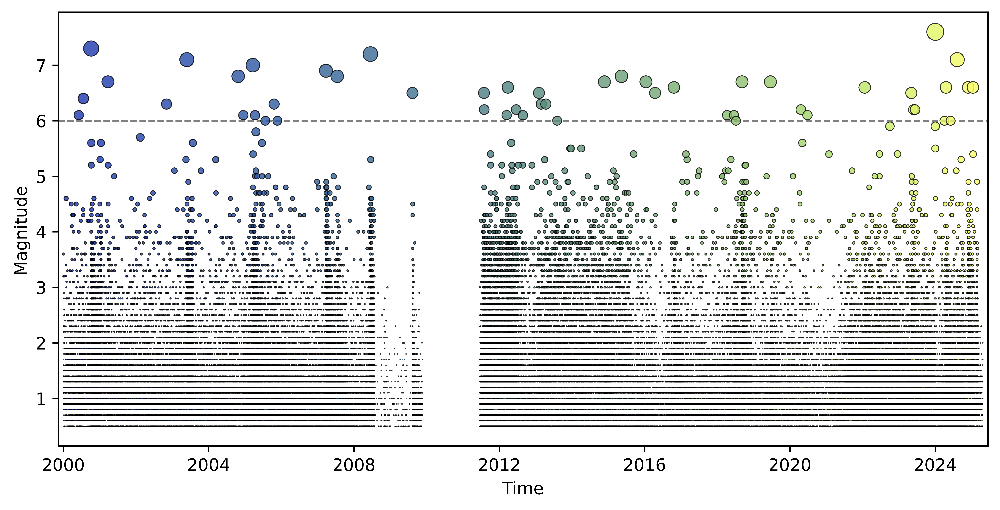

In [10]:
# Plot time
fig_time, ax_time = plt.subplots(figsize=(8, 4))

# put a dotted line at M= 6
ax_time.axhline(6, color='grey', linestyle='--', label=r'M $\geq$ 6', linewidth=1, zorder=-10)

color_scale= (all_sequences.time - min(all_sequences.time)) / (max(all_sequences.time) - min(all_sequences.time))
color = cmap(color_scale)
plot_mags_in_time(all_sequences.time, all_sequences.magnitude,
                      dot_smallest=0.1, dot_largest=100,
                      dot_interpolation_power=5, ax=ax_time, color_dots=color)

ax_time.set_xlim(min(all_sequences.time) - pd.Timedelta(days=50), max(all_sequences.time) + pd.Timedelta(days=50))

# Save time figure to buffer
fig_time.set_dpi(600)
fig_time.tight_layout(pad=0.1)
canvas_time = FigureCanvas(fig_time)
buf_time = io.BytesIO()
canvas_time.print_png(buf_time)
buf_time.seek(0)
img_time = mpimg.imread(buf_time)

Text(0.05, 1.05, '(b)')

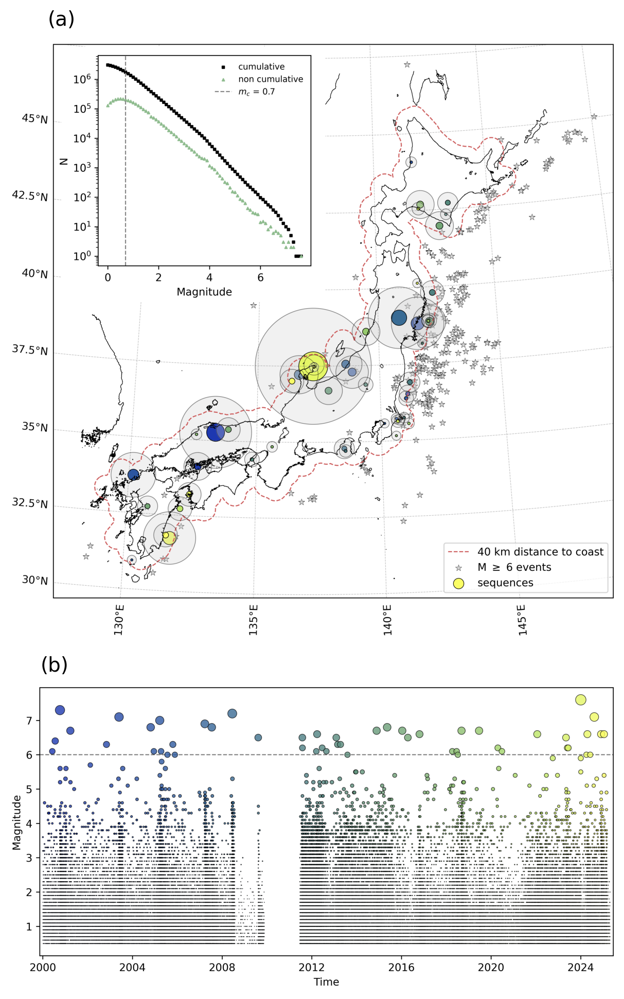

In [11]:
# --- Combine both in one final figure ---

fig_final, (ax_top, ax_bottom) = plt.subplots(
    2, 1,
    figsize=(8, 12),
    gridspec_kw={
        'height_ratios': [2, 1],
        'hspace': 0.1   # make this negative to overlap
    }
)


# Show images in subplots 
ax_top.imshow(img_map)
ax_top.axis('off')
ax_top.text(0.062, 1.02, '(a)', transform=ax_top.transAxes, fontsize=14)

ax_bottom.imshow(img_time)
ax_bottom.axis('off')
ax_bottom.text(0.05, 1.05, '(b)', transform=ax_bottom.transAxes, fontsize=14)


# A. 2. General significance of variation of b-values

In [12]:
# Load data
p_space_a = np.loadtxt('results/b_significant/p_values_space_1dcutoff.csv', delimiter=',')
p_space_b = np.loadtxt('results/b_significant/p_values_space_2dcutoff.csv', delimiter=',')
p_time_a = np.loadtxt('results/b_significant/p_values_time_1dcutoff.csv', delimiter=',')
p_time_b = np.loadtxt('results/b_significant/p_values_time_2dcutoff.csv', delimiter=',')


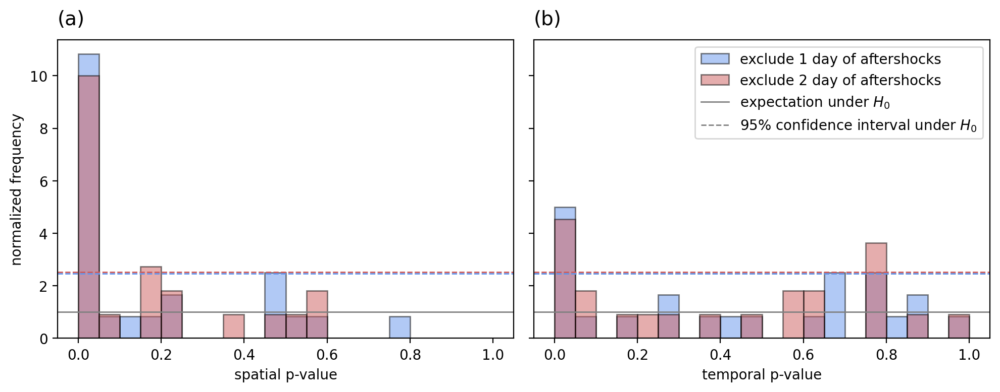

Number of non-NaN values (time 1D): 24
Number of non-NaN values (time 2D): 24
Number of non-NaN values (space 1D): 22
Number of non-NaN values (space 2D): 22


In [13]:
# Index
ii = 1

# Create figure
fig, axs = plt.subplots(1, 2, figsize=(10, 4), sharey=True)

# Plot space histogram
axs[0].hist(p_space_a[:, ii], bins=np.arange(0, 1.05, 0.05), alpha=0.5, color='cornflowerblue', edgecolor='black', density=True)
axs[0].hist(p_space_b[:, ii], bins=np.arange(0, 1.05, 0.05), alpha=0.5, color='indianred', edgecolor='black', density=True)
# add title to the left subplot
axs[0].text(0.0, 1.05, '(a)', transform=axs[0].transAxes, fontsize=14)
axs[0].axhline(1, color='grey', linestyle='-', linewidth=1)
variance_hist_a = (len(np.arange(0, 1.05, 0.05))- 2) / np.sum(~np.isnan(p_time_a[:, ii]))
variance_hist_b = (len(np.arange(0, 1.05, 0.05))- 2) / np.sum(~np.isnan(p_time_b[:, ii]))
axs[0].axhline(1 + 1.645*np.sqrt(variance_hist_a), color='cornflowerblue', linestyle='--', linewidth=1)
axs[0].axhline(1 + 1.645*np.sqrt(variance_hist_b), color='indianred', linestyle='--', linewidth=1)

axs[0].set_xlabel('spatial p-value')
axs[0].set_ylabel('normalized frequency')

# Plot time histogram
axs[1].hist(p_time_a[:, ii], bins=np.arange(0, 1.05, 0.05), alpha=0.5, color='cornflowerblue', edgecolor='black', density=True, label='exclude 1 day of aftershocks')
axs[1].hist(p_time_b[:, ii], bins=np.arange(0, 1.05, 0.05), alpha=0.5, color='indianred', edgecolor='black', density=True, label='exclude 2 day of aftershocks')
axs[1].set_xlabel('temporal p-value')
# Add legend
axs[1].text(0.0, 1.05, '(b)', transform=axs[1].transAxes, fontsize=14)
axs[1].axhline(1, color='grey', linestyle='-', linewidth=1, label=r'expectation under $H_0$')

axs[1].axhline(1 + 1.645*np.sqrt(variance_hist_a), color='grey', linestyle='--', linewidth=1, label=r'95% confidence interval under $H_0$')
axs[1].axhline(1 + 1.645*np.sqrt(variance_hist_a), color='cornflowerblue', linestyle='--', linewidth=1)
axs[1].axhline(1 + 1.645*np.sqrt(variance_hist_b), color='indianred', linestyle='--', linewidth=1)
# add legend
axs[1].legend(loc='upper right')

# Adjust layout
plt.tight_layout()

# Save figure if needed
# plt.savefig('combined_histograms.png', dpi=300)

plt.show()

# Print non-NaN counts
print('Number of non-NaN values (time 1D):', np.sum(~np.isnan(p_space_a[:, ii])))
print('Number of non-NaN values (time 2D):', np.sum(~np.isnan(p_time_a[:, ii])))

print('Number of non-NaN values (space 1D):', np.sum(~np.isnan(p_space_b[:, ii])))
print('Number of non-NaN values (space 2D):', np.sum(~np.isnan(p_time_b[:, ii])))


# A. 3. Test of systematic shifts of the b-value

In [14]:
filename = (
    'results/parameter_variation/df_b_values_'+
    str(MAGNITUDE_THRESHOLD)+'M_global_'+
    RUPTURE_RELATION + '_' + str(DAYS_AFTER) +'days_'+
    str(int(BUFFER_M/1000)) + 'km_'+
    str(DIMENSION) + 'D_' + 
    str(EXCLUDE_AFTERSHOCK_DAYS) + 'days.csv')

df = pd.read_csv(filename, index_col=0)

In [15]:
# size
size_main = cat_close.loc[df.index, 'magnitude'].values

# hypothesis testing
results  = test_hypothesis(df)

/var/folders/2_/2txg_9093x37rv1ls3774xkc0000gn/T/ipykernel_53635/2884114615.py:74: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  inset.add_patch(Rectangle((0.1, 1), x_event - 0.1, h, color='gray', alpha=0.8, edgecolor='black'))
/var/folders/2_/2txg_9093x37rv1ls3774xkc0000gn/T/ipykernel_53635/2884114615.py:75: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  inset.add_patch(Rectangle((x_event, 1), 0.9 - x_event, h, color='gray', alpha=0.4, edgecolor='dimgray'))
/var/folders/2_/2txg_9093x37rv1ls3774xkc0000gn/T/ipykernel_53635/2884114615.py:109: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  inset.add_patch(Rectangle((0.1, 1), x_event/2 - 0.05, h, color='gray', alpha=0.4, edgecolor='black'))
/var/folders/2_/2txg_9093x37rv1ls3774xkc0000gn/T/ipykernel_53635/2884114615.py:110: UserWarning: Setting the 'color' property will override the edgecolor

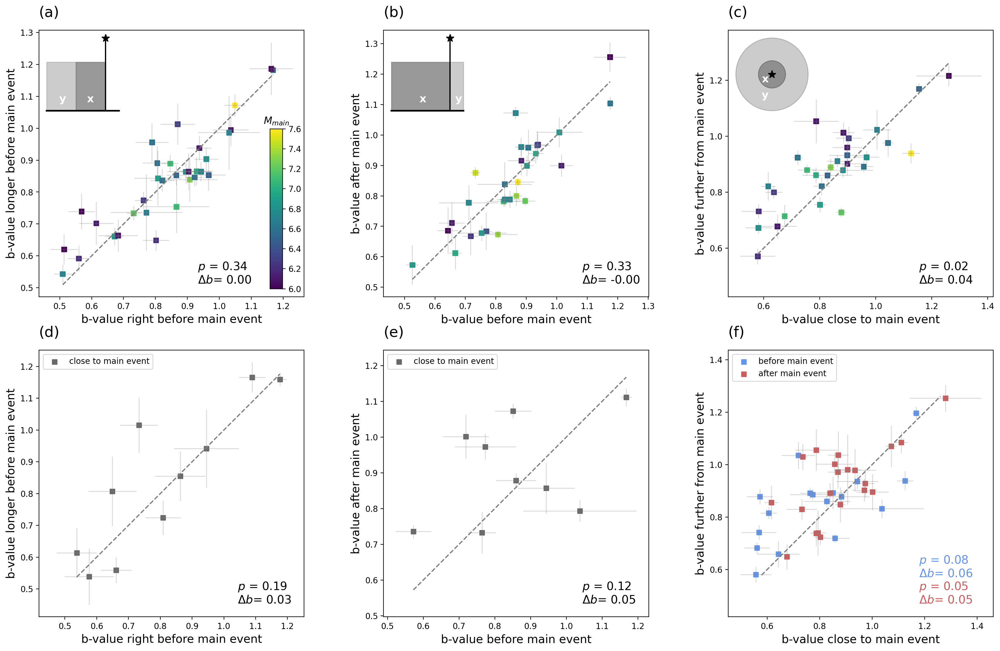

In [16]:
fig, axs = plt.subplots(2, 3, figsize=(21, 13))

# --- tiny, reusable helpers (used across panels) ---
def one2one(ax, x):
    vmin, vmax = np.nanmin(x), np.nanmax(x)
    ax.plot([vmin, vmax], [vmin, vmax], '--', c='grey')

def statpair(ax, p, d, x=0.72, y=0.1, color=None):
    ax.text(x, y,       rf'$p$ = {p:.2f}',       transform=ax.transAxes, fontsize=14, color=color)
    ax.text(x, y - 0.05, rf'$\Delta b$= {d:.2f}', transform=ax.transAxes, fontsize=14, color=color)

def scatter_err(ax, x, y, xerr, yerr, **scatter_kw):
    sc = ax.scatter(x, y, **scatter_kw)
    ax.errorbar(x, y, xerr=xerr, yerr=yerr, fmt='none', ecolor='grey', alpha=0.3, linewidth=1)
    return sc

# ====================== (c) SPACE ======================
sc0 = scatter_err(axs[0,2],
                  df['b_close'], df['b_far'],
                  df['std_close'], df['std_far'],
                  c=size_main, marker='s', cmap='viridis')
one2one(axs[0,2], df['b_close'])
statpair(axs[0,2], results['p_farclose'], results['mean_diff_farclose'])
axs[0,2].axis('equal')
axs[0,2].set_xlabel('b-value close to main event', fontsize=14)
axs[0,2].set_ylabel('b-value further from main event', fontsize=14)

# inset (SPACE: concentric circles)
inset = inset_axes(axs[0,2], width="30%", height="30%", loc='upper left')
inset.axis('off')
inset.add_patch(Circle((0.5, 0.5), 0.4, facecolor='gray', alpha=0.4, edgecolor='dimgrey'))
inset.add_patch(Circle((0.5, 0.5), 0.15, facecolor='gray', alpha=0.8, edgecolor='dimgrey'))
inset.plot(0.5, 0.5, marker='*', color='black', markersize=10)
inset.text(0.37, 0.4, 'x', transform=inset.transAxes, fontsize=13, color='w', weight='bold')
inset.text(0.37, 0.2, 'y', transform=inset.transAxes, fontsize=13, color='w', weight='bold')

# colorbar (linked to SPACE scatter)
cax = inset_axes(axs[0,0], width="5%", height="60%", loc='lower right',
                 bbox_to_anchor=(0, 0, 0.95, 1), bbox_transform=axs[0,0].transAxes, borderpad=1)
fig.colorbar(sc0, cax=cax).ax.set_title(r'$M_{main}$', fontsize=12)

# ================== (f) BEFORE vs AFTER: close–far ==================
scatter_err(axs[1,2],
            df['b_close_before'], df['b_far_before'],
            df['std_close_before'], df['std_far_before'],
            c='cornflowerblue', marker='s', label='before main event')
scatter_err(axs[1,2],
            df['b_close_after'], df['b_far_after'],
            df['std_close_after'], df['std_far_after'],
            c='indianred', marker='s', label='after main event')
one2one(axs[1,2], df['b_close'])
statpair(axs[1,2], results['p_before_farclose'], results['mean_diff_before_farclose'], y=0.2, color='cornflowerblue')
statpair(axs[1,2], results['p_after_farclose'],  results['mean_diff_after_farclose'],  y=0.1, color='indianred')
axs[1,2].axis('equal')
axs[1,2].set_xlabel('b-value close to main event', fontsize=14)
axs[1,2].set_ylabel('b-value further from main event', fontsize=14)
axs[1,2].legend(loc='upper left')

# ====================== (b) BEFORE vs AFTER ======================
scatter_err(axs[0,1],
            df['b_before'], df['b_after'],
            df['std_before'], df['std_after'],
            c=size_main, marker='s', cmap='viridis')
one2one(axs[0,1], df['b_before'][~np.isnan(df['b_after'])])
statpair(axs[0,1], results['p_beforeafter'], results['mean_diff_beforeafter'], x=0.75)
axs[0,1].axis('equal')
axs[0,1].set_xlabel('b-value before main event', fontsize=14)
axs[0,1].set_ylabel('b-value after main event', fontsize=14)

# inset (BEFORE/AFTER: two rectangles)
inset = inset_axes(axs[0,1], width="30%", height="30%", loc='upper left')
inset.axis('off')
h, x_event = 0.1, 0.75
inset.add_patch(Rectangle((0.1, 1), x_event - 0.1, h, color='gray', alpha=0.8, edgecolor='black'))
inset.add_patch(Rectangle((x_event, 1), 0.9 - x_event, h, color='gray', alpha=0.4, edgecolor='dimgray'))
inset.plot([0.1, 0.9], [1, 1], color='black', lw=2)
inset.plot([x_event, x_event], [1, 1 + 0.15], color='black', lw=1.5)
inset.plot(x_event, 1 + 0.15, marker='*', color='black', markersize=10)
inset.text(0.4, 0.15, 'x', transform=inset.transAxes, fontsize=13, color='w', weight='bold')
inset.text(0.85, 0.15, 'y', transform=inset.transAxes, fontsize=13, color='w', weight='bold')

# =============== (e) BEFORE vs AFTER: close only =================
scatter_err(axs[1,1],
            df['b_close_before'], df['b_close_after'],
            df['std_close_before'], df['std_close_after'],
            c='dimgray', marker='s', label='close to main event')
one2one(axs[1,1], df['b_close_before'][~np.isnan(df['b_close_after'])])
statpair(axs[1,1], results['p_close_beforeafter'], results['mean_diff_close_beforeafter'], x=0.75)
axs[1,1].axis('equal')
axs[1,1].set_xlabel('b-value before main event', fontsize=14)
axs[1,1].set_ylabel('b-value after main event', fontsize=14)
axs[1,1].legend(loc='upper left')

# =================== (a) BEFORE vs BEFORE ===================
scatter_err(axs[0,0],
            df['b_before2'], df['b_before1'],
            df['std_before2'], df['std_before1'],
            c=size_main, marker='s', cmap='viridis')
one2one(axs[0,0], df['b_before2'][~np.isnan(df['b_before1'])])
statpair(axs[0,0], results['p_before_before'], results['mean_diff_before_before'], x=0.6)
axs[0,0].axis('equal')
axs[0,0].set_xlabel('b-value right before main event', fontsize=14)
axs[0,0].set_ylabel('b-value longer before main event', fontsize=14)

# inset (BEFORE/BEFORE: split rectangles)
inset = inset_axes(axs[0,0], width="30%", height="30%", loc='upper left')
inset.axis('off')
h, x_event = 0.1, 0.75
inset.add_patch(Rectangle((0.1, 1), x_event/2 - 0.05, h, color='gray', alpha=0.4, edgecolor='black'))
inset.add_patch(Rectangle((x_event/2 + 0.05, 1), x_event/2 - 0.05, h, color='gray', alpha=0.8, edgecolor='grey'))
inset.plot([0.1, 0.9], [1, 1], color='black', lw=2)
inset.plot([x_event, x_event], [1, 1 + 0.15], color='black', lw=1.5)
inset.plot(x_event, 1 + 0.15, marker='*', color='black', markersize=10)
inset.text(0.2, 0.15, 'y', transform=inset.transAxes, fontsize=13, color='w', weight='bold')
inset.text(0.55, 0.15, 'x', transform=inset.transAxes, fontsize=13, color='w', weight='bold')

# ============== (d) BEFORE vs BEFORE: close only ==============
scatter_err(axs[1,0],
            df['b_before2_close'], df['b_before1_close'],
            df['std_before2_close'], df['std_before1_close'],
            c='dimgrey', marker='s', label='close to main event')
one2one(axs[1,0], df['b_before2_close'][~np.isnan(df['b_before1_close'])])
statpair(axs[1,0], results['p_beforebefore_close'], results['mean_diff_beforebefore_close'], x=0.75)
axs[1,0].axis('equal')
axs[1,0].set_xlabel('b-value right before main event', fontsize=14)
axs[1,0].set_ylabel('b-value longer before main event', fontsize=14)
axs[1,0].legend(loc='upper left')

# ========================= labels & layout =========================
for ax, label in zip(axs.flat, ['(a)','(b)','(c)','(d)','(e)','(f)']):
    ax.text(0.0, 1.05, label, transform=ax.transAxes, fontsize=18)

fig.subplots_adjust(wspace=0.3)


# A. 4. Mapping the b-value and comparing to the sequence-b-values

In [17]:
# Load data of partial map
b_values = pd.read_csv(f'results/map/b_values_N{N_FULL_MAP}.csv')
b_avg = b_values['b_avg'].values
b_std = b_values['b_std'].values

# load grid and full map
df_grid = pd.read_csv(DIR / "df_grid.csv")
b_values = pd.read_csv(f'results/map/b_values_N{N_FULL_MAP}_full.csv')
b_avg_map = b_values['b_avg'].values
b_std_map = b_values['b_std'].values

In [18]:
# filter depth
desired_depth = 1  # Choose the z-value to plot
mask = abs(df_grid.depth - desired_depth) < 0.1  # Boolean mask where z = desired_z
values_2D = b_avg_map[mask]    # Extract corresponding values
values_2D_std = b_std_map[mask]    # Extract corresponding values


df_grid = df_grid[mask]

T-statistic: 0.474
P-value: 3.193e-01
Mean difference: 0.008


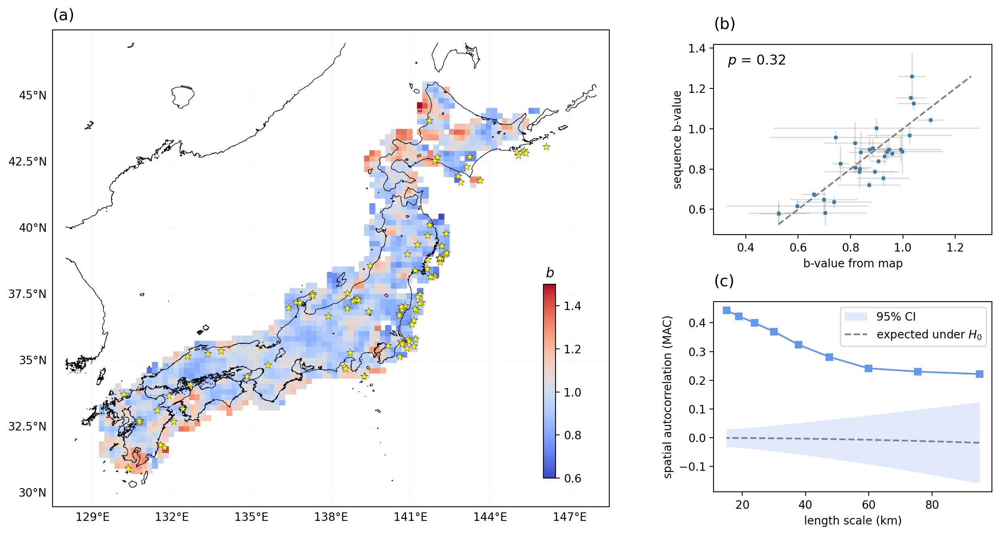

In [33]:
fig = plt.figure(figsize=(15, 8))

# ---- OUTER GRID: left (a) and right (b+c) ----
outer_gs = fig.add_gridspec(
    1, 2, width_ratios=[2, 1], wspace=0.25
)

# ---------------- Panel (a): Map (left column) ----------------
ax0 = fig.add_subplot(outer_gs[0, 0], projection=ccrs.PlateCarree())

valid_lon = df_coast['longitude'][np.isfinite(df_coast['longitude'])]
valid_lat = df_coast['latitude'][np.isfinite(df_coast['latitude'])]

lon_min = valid_lon.min() - 0.5
lon_max = valid_lon.max() + 0.5
lat_min = valid_lat.min() - 0.5
lat_max = valid_lat.max() + 0.5

ax0.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
gl = ax0.gridlines(draw_labels=True, linewidth=0.1, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False

sc = ax0.scatter(df_grid['longitude'][values_2D_std < 0.7], 
                 df_grid['latitude'][values_2D_std < 0.7],
                 c=values_2D[values_2D_std < 0.7],
                 cmap='coolwarm', vmin=0.6, vmax=1.5,
                 marker='s', s=20, transform=ccrs.PlateCarree())

ax0.plot(df_coast['longitude'], df_coast['latitude'], 'k', linewidth=0.5, transform=ccrs.PlateCarree())

# scatter large events
ax0.scatter(df_japan_Large_close['longitude'], df_japan_Large_close['latitude'],
            s=50, c='yellow', linewidth=0.2, marker='*', edgecolor='black', zorder=10)

# Colorbar INSIDE panel (a)
cbar_ax = fig.add_axes([0.53, 0.17, 0.01, 0.3])

cbar = plt.colorbar(sc, cax=cbar_ax)
cbar.ax.set_title(r'$b$', fontsize=12)

# ---- RIGHT COLUMN
right_with_spacers = outer_gs[0, 1].subgridspec(3, 1, height_ratios=[0.05, 0.90, 0.05], hspace=0.0)
right_inner = right_with_spacers[1, 0].subgridspec(2, 1, hspace=0.35)

# ---------------- Panel (b): Scatter (top-right) ----------------
ax1 = fig.add_subplot(right_inner[0, 0])

ax1.scatter(b_avg, df["b_close"], marker='s', s=5)
ax1.errorbar(b_avg, df["b_close"], 
             xerr=b_std, yerr=df["std_close"], 
             fmt='none', ecolor='grey', alpha=0.3, linewidth=1)
mask = ~np.isnan(b_avg) & ~np.isnan(df["b_close"])
min_val = min(np.nanmin(b_avg[mask]), np.nanmin(df["b_close"][mask]))
max_val = max(np.nanmax(b_avg[mask]), np.nanmax(df["b_close"][mask]))
ax1.plot([min_val, max_val],
         [min_val, max_val], '--', c='grey')
ax1.set_ylabel('sequence b-value')
ax1.set_xlabel('b-value from map')

# ---------------- Panel (c): New plot (bottom-right) ----------------
ax2 = fig.add_subplot(right_inner[1, 0])

NS = [200, 400, 800, 1600, 3200, 6400, 12800, 25600, 51200]
macs, mu_macs, std_macs = [], [], []
length_scales = []
for n in NS:
    macs_all = pd.read_csv(f'results/map/macs_volume_lengthscale_N{n}.csv')
    mac_spatial = macs_all['mac_spatial'].values
    mu_mac_spatial = macs_all['mu_mac_spatial'].values
    std_mac_spatial = macs_all['std_mac_spatial'].values
    length_scale_loop = macs_all['length_scale'].values
    length_scales.append(length_scale_loop[0])
    macs.append(mac_spatial[0])
    mu_macs.append(mu_mac_spatial[0])
    std_macs.append(std_mac_spatial[0])
macs = np.array(macs)
mu_macs = np.array(mu_macs)
std_macs = np.array(std_macs)
length_scales = np.array(length_scales)

ax2.plot(length_scales, macs, color='cornflowerblue', marker='s')
ax2.fill_between(length_scales,
                 mu_macs - 1.96 * std_macs,
                 mu_macs + 1.96 * std_macs,
                 alpha=0.2, label='95% CI', color='cornflowerblue', linewidth=0)
ax2.plot(length_scales, mu_macs, label=r'expected under $H_0$', color='gray', linestyle='--')
ax2.set_xlabel('length scale (km)')
ax2.set_ylabel('spatial autocorrelation (MAC)')
ax2.legend()

# ---------------- Labels ----------------
ax0.text(0.0, 1.02, '(a)', transform=ax0.transAxes, fontsize=14)
ax1.text(0, 1.08, '(b)', transform=ax1.transAxes, fontsize=14)
ax2.text(0, 1.08, '(c)', transform=ax2.transAxes, fontsize=14)

# ---------------- p-value ----------------
diff = b_avg - df["b_close"]
diff = diff[~np.isnan(diff)]

t_stat, p_value = stats.ttest_1samp(diff, popmean=0, alternative='greater')

print(f"T-statistic: {t_stat:.3f}")
print(f"P-value: {p_value:.3e}")
print(f"Mean difference: {np.nanmean(diff):.3f}")

ax1.text(
    0.05, 0.95,
    f"$p$ = {p_value:.2f}",
    transform=ax1.transAxes,
    fontsize=12,
    verticalalignment='top'
)

plt.show()


# B. 1. Robustness analysis

In [126]:
# load csv as dataframe
filepath = "results/parameter_variation/aggregated_results.csv"
df_results = pd.read_csv(filepath)

# chose fixed parameters
df_results = df_results[df_results['dimension'] == DIMENSION]
df_results = df_results[df_results['b_method'] == B_METHOD]

In [107]:
def plot_aftershock_panels(df_results, filter_col, filter_vals, labels, p_threshold, fig_a='a', fig_b='b'):
    def compute_quantiles(df):
        return (
            df.quantile(0.5, numeric_only=True),
            df.quantile(0.05, numeric_only=True),
            df.quantile(0.95, numeric_only=True),
        )

    def plot_panel(ax, categories, hline, ylabel, xticklabels=None,
                   medians=None, p5s=None, p95s=None, labels=None, colors=None):
        x = np.arange(len(categories))
        width = 0.1
        offsets = np.linspace(-width, width, len(medians))

        for med, p5, p95, lab, col, off in zip(medians, p5s, p95s, labels, colors, offsets):
            y = [med[c] for c in categories]
            yerr_low  = np.array([med[c] - p5[c]  for c in categories])
            yerr_high = np.array([p95[c] - med[c] for c in categories])
            ax.scatter(x + off, y, color=col, label=lab, marker='s', s=20)
            ax.errorbar(x + off, y, yerr=[yerr_low, yerr_high],
                        fmt='none', color=col, capsize=5)

        ax.axhline(hline, color='grey', linestyle='--', linewidth=1)
        ax.set_ylabel(ylabel)
        ax.set_xticks(x)
        ax.set_xticklabels(xticklabels if xticklabels else categories, rotation=45, ha='right')

    # ---- categories defined inside ----
    categories1 = [
        'p_beforeafter','p_close_beforeafter','p_far_beforeafter',
        'p_farclose','p_before_farclose','p_after_farclose',
        'p_before_before','p_beforebefore_close'
    ]

    categories2 = [
        'mean_diff_beforeafter','mean_diff_close_beforeafter','mean_diff_far_beforeafter',
        'mean_diff_farclose','mean_diff_before_farclose','mean_diff_after_farclose',
        'mean_diff_before_before','mean_diff_beforebefore_close'
    ]
    category_labels = [
        'before vs. after','close: before vs. after','far: before vs. after',
        'far vs. close','before: far vs. close','after: far vs. close',
        'before vs. before','close: before vs. before'
    ]

    # ---- compute quantiles for each group ----
    medians, p5s, p95s = [], [], []
    labels = labels
    colors = ['black', 'cornflowerblue', 'indianred'][:len(labels)]

    for val in filter_vals:
        subset = df_results[df_results[filter_col] == val]
        med, p5, p95 = compute_quantiles(subset)
        medians.append(med)
        p5s.append(p5)
        p95s.append(p95)

    # ---- make figure ----
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    plot_panel(
        axes[0], categories1, hline=p_threshold, ylabel='p-value',
        xticklabels=category_labels,
        medians=medians, p5s=p5s, p95s=p95s,
        labels=labels, colors=colors
    )

    plot_panel(
        axes[1], categories2, hline=0, ylabel=r'$\Delta b$',
        xticklabels=category_labels,
        medians=medians, p5s=p5s, p95s=p95s,
        labels=labels, colors=colors
    )

    # Shared legend
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, bbox_to_anchor=(0.995, 0.93),
               fontsize=10, ncol=len(filter_vals))

    # Panel labels
    axes[0].text(0.03, 1.05, "("+fig_a+")", transform=axes[0].transAxes,
                 fontsize=14, va="bottom", ha="right")
    axes[1].text(0.03, 1.05, "("+fig_b+")", transform=axes[1].transAxes,
                 fontsize=14, va="bottom", ha="right")

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


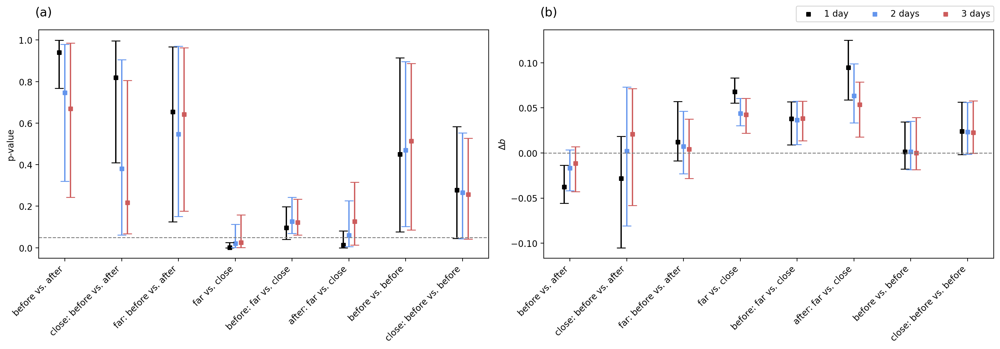

In [127]:
plot_aftershock_panels(df_results,
                       filter_col='exclude_aftershocks_day',
                       filter_vals=[0, 1, 2],
                       labels = ['1 day','2 days','3 days'],
                       p_threshold=P_THRESHOLD,
                       fig_a='a', fig_b='b')

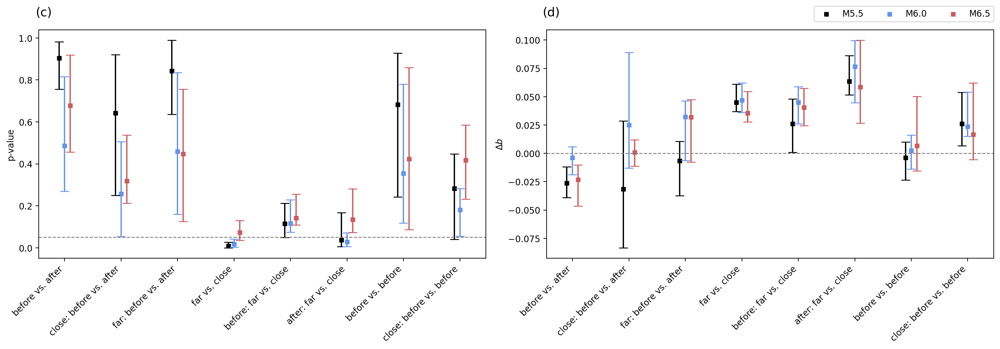

In [138]:
df_results_1d = df_results[df_results["exclude_aftershocks_day"] == 1]
plot_aftershock_panels(df_results_1d,
                       filter_col='magnitude_threshold',
                       filter_vals=[5.5, 6.0, 6.5],
                       labels = ['M5.5', 'M6.0', 'M6.5'],
                       p_threshold=P_THRESHOLD,
                       fig_a='c', fig_b='d',)

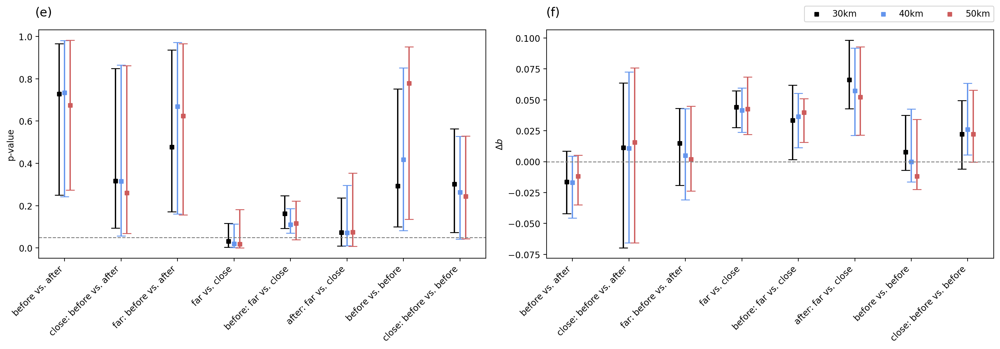

In [145]:
plot_aftershock_panels(df_results_1d,
                       filter_col='distance_to_coast',
                       filter_vals=[30, 40, 50],
                       labels = ['30km', '40km', '50km'],
                       p_threshold=P_THRESHOLD,
                       fig_a='e', fig_b='f',)

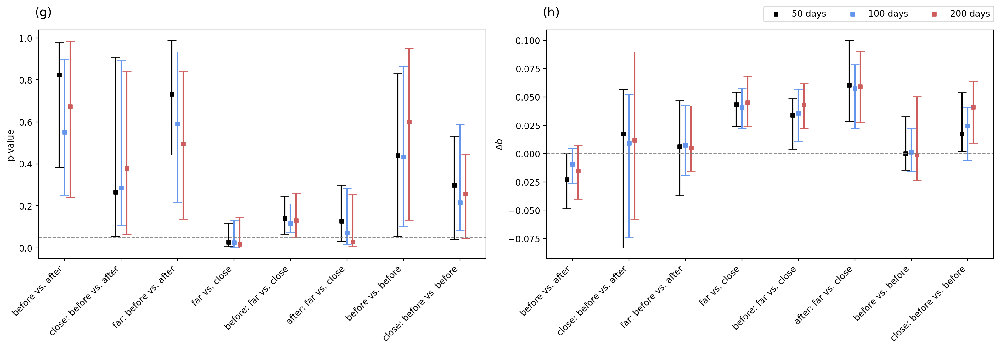

In [146]:
plot_aftershock_panels(df_results_1d,
                       filter_col='days_after',
                       filter_vals=[50, 100, 200],
                       labels = ['50 days', '100 days', '200 days'],
                       p_threshold=P_THRESHOLD,
                       fig_a='g', fig_b='h',)

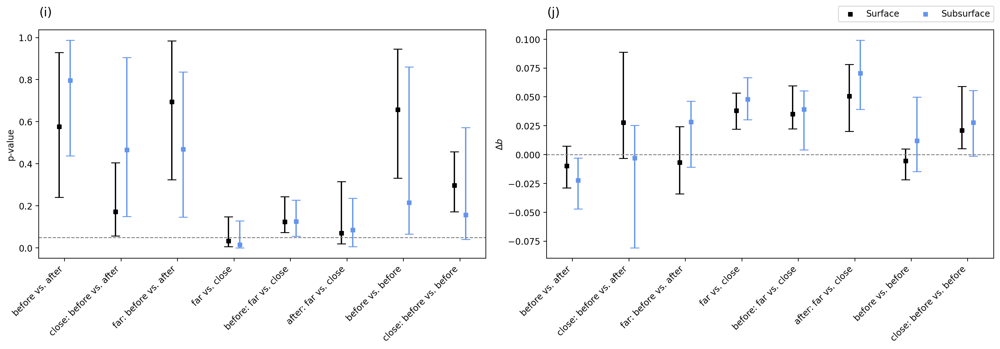

In [147]:
plot_aftershock_panels(df_results_1d,
                       filter_col='rupture_relation',
                       filter_vals=['surface', 'subsurface'],
                       labels = ['Surface', 'Subsurface'],
                       p_threshold=P_THRESHOLD,
                       fig_a='i', fig_b='j',)

# B. 2. Synthetic tests

In [155]:
# load csv with total shuffle
path = Path("results") / "synthetics" / "all_results.csv"
df_synthetic = pd.read_csv(path, index_col=0)

# load csv with depth conserving shuffle
path = Path("results") / "synthetics" / "all_results_rd.csv"
df_synthetic_rd = pd.read_csv(path, index_col=0)

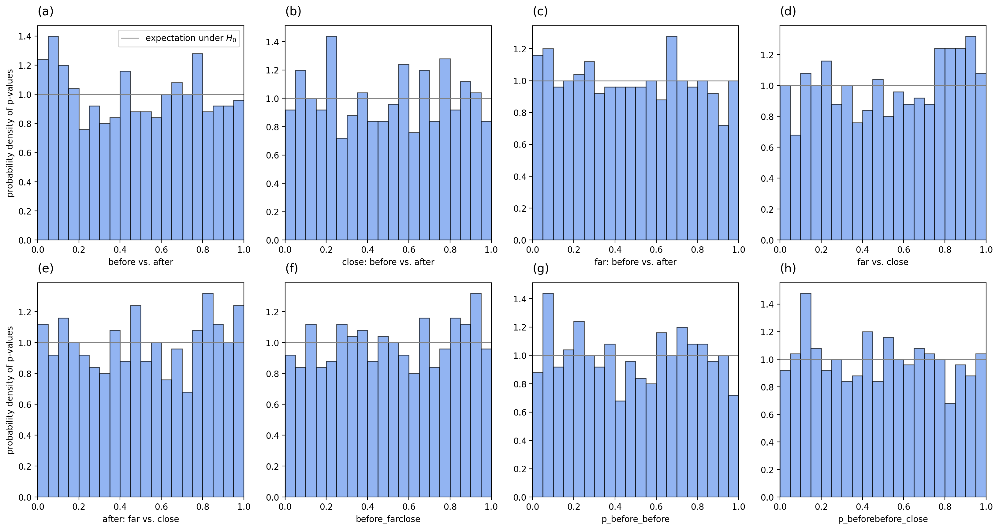

In [167]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

names = ['p_beforeafter', 'p_close_beforeafter', 'p_far_beforeafter', 'p_farclose', 'p_after_farclose', 'p_before_farclose', 'p_before_before', 'p_beforebefore_close']

labs = ['before vs. after', 'close: before vs. after', 'far: before vs. after', 'far vs. close', 'after: far vs. close', 'before_farclose', 'p_before_before', 'p_beforebefore_close']

for ii, ax in enumerate(axs.flat):
    name = names[ii]
    ax.hist(df_synthetic[name], bins=np.arange(0, 1.05, 0.05), alpha=0.7, color='cornflowerblue', edgecolor='black', density=True)
    ax.axhline(1, color='grey', linestyle='-', linewidth=1, label=r'expectation under $H_0$')
    ax.set_xlabel(labs[ii])
    ax.text(0.0, 1.05, f'({chr(97+ii)})', transform=ax.transAxes, fontsize=14)
    ax.set_xlim(0, 1)
    ax.set_ylim(0, None)
    if ii == 0:
        ax.legend(loc='upper right')

    axs[0,0].set_ylabel('probability density of p-values')
    axs[1,0].set_ylabel('probability density of p-values')

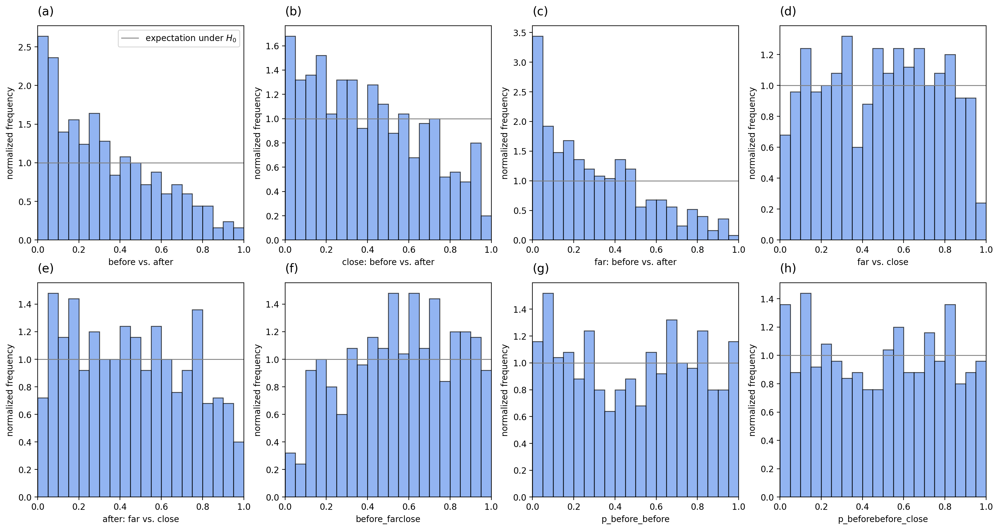

In [160]:
fig, axs = plt.subplots(2, 4, figsize=(20, 10))

for ii, ax in enumerate(axs.flat):
    name = names[ii]
    ax.hist(df_synthetic_rd[name], bins=np.arange(0, 1.05, 0.05), alpha=0.7, color='cornflowerblue', edgecolor='black', density=True)
    ax.axhline(1, color='grey', linestyle='-', linewidth=1, label=r'expectation under $H_0$')
    ax.set_xlabel(labs[ii])
    ax.set_ylabel('normalized frequency')
    ax.text(0.0, 1.05, f'({chr(97+ii)})', transform=ax.transAxes, fontsize=14)
    ax.set_xlim(0, 1)
    ax.set_ylim(0, None)
    if ii == 0:
        ax.legend(loc='upper right')